In [4]:
!pip install pytorch_pretrained_vit

Defaulting to user installation because normal site-packages is not writeable
Looking in indexes: https://pypi.org/simple, https://pypi.ngc.nvidia.com
  Created wheel for pytorch-pretrained-vit: filename=pytorch_pretrained_vit-0.0.7-py3-none-any.whl size=11132 sha256=0934fa58370b26fe76959f3cf1b3cfb15d5314acae94af54767db8f7804bf17d
  Stored in directory: /tmp/pip-ephem-wheel-cache-179hg7v_/wheels/e6/78/4d/447580dd8e95a2aafa0b85820e811568b6b8a8f5460656c0ee
Successfully built pytorch-pretrained-vit
You should consider upgrading via the '/usr/bin/python -m pip install --upgrade pip' command.


In [50]:
import numpy as np
import pandas as pd
from PIL import Image
import matplotlib.pyplot as plt
from torch import tensor
import torch
from torch.utils.data import Sampler
from torch.utils.data import Dataset
from torch.utils.data import DataLoader
from torch.utils.data import BatchSampler
from torchvision.transforms import transforms

from torch import nn
from torch import optim
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms, utils
import torchvision
from pytorch_pretrained_vit import ViT
import os

In [51]:
# basic model setupt & load

vit =  ViT('B_16_imagenet1k', pretrained=True)
class VisionTransformer(nn.Module):
    def __init__(self):
        super(VisionTransformer, self).__init__()
        self.vit = vit
        self.linear = nn.Linear(1000, 1)

        
      
    def forward(self, x):
        x = self.vit(x)
        x = torch.sigmoid(self.linear(x))
        return x
model =  VisionTransformer()
model = model.to("cpu")

Loaded pretrained weights.


In [52]:
#model .pt load
device = torch.device('cpu')
model.load_state_dict(torch.load("./weights/vit_2023-11-14 17:24:36_model.pt", map_location=device))
model.eval()

VisionTransformer(
  (vit): ViT(
    (patch_embedding): Conv2d(3, 768, kernel_size=(16, 16), stride=(16, 16))
    (positional_embedding): PositionalEmbedding1D()
    (transformer): Transformer(
      (blocks): ModuleList(
        (0): Block(
          (attn): MultiHeadedSelfAttention(
            (proj_q): Linear(in_features=768, out_features=768, bias=True)
            (proj_k): Linear(in_features=768, out_features=768, bias=True)
            (proj_v): Linear(in_features=768, out_features=768, bias=True)
            (drop): Dropout(p=0.1, inplace=False)
          )
          (proj): Linear(in_features=768, out_features=768, bias=True)
          (norm1): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
          (pwff): PositionWiseFeedForward(
            (fc1): Linear(in_features=768, out_features=3072, bias=True)
            (fc2): Linear(in_features=3072, out_features=768, bias=True)
          )
          (norm2): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
         

In [53]:
#image 전처리
transform = transforms.Compose([
    transforms.ToPILImage(),
    transforms.ToTensor(),
    transforms.Resize(size=(384,384)),
    transforms.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225))
])

In [54]:
data = os.listdir("./val_image/")

In [56]:
len(data)

32

In [57]:
4 // 3

1

In [59]:
int(4 / 3)

1

In [ ]:
fig, axes = plt.subplots(8,4)

In [63]:
import cv2

In [95]:
import random
random.shuffle(data)

In [96]:
data

['WIN_20231109_16_40_28_Pro.jpg',
 'U_3.jpg',
 'KakaoTalk_20231116_143308287.jpg',
 'WIN_20231109_16_37_13_Pro.jpg',
 'KakaoTalk_20231116_143306462.jpg',
 'WIN_20231109_16_37_33_Pro.jpg',
 'KakaoTalk_20231116_143004660.jpg',
 'WIN_20231109_16_37_38_Pro.jpg',
 'KakaoTalk_20231116_142956302.jpg',
 'KakaoTalk_20231116_143245511.jpg',
 'WIN_20231109_16_37_40_Pro.jpg',
 'WIN_20231109_16_39_52_Pro.jpg',
 'WIN_20231109_16_38_54_Pro.jpg',
 'KakaoTalk_20231116_143301913.jpg',
 'KakaoTalk_20231116_143000575.jpg',
 'U_2.jpg',
 'WIN_20231109_16_37_37_Pro.jpg',
 'WIN_20231109_16_39_28_Pro.jpg',
 'WIN_20231109_16_37_17_Pro.jpg',
 'U_1.jpg',
 'WIN_20231109_16_39_42_Pro.jpg',
 'WIN_20231109_16_39_14_Pro.jpg',
 'C_2.jpg',
 'WIN_20231109_16_37_30_Pro.jpg',
 'WIN_20231109_16_40_15_Pro.jpg',
 'KakaoTalk_20231116_142951759.jpg',
 'KakaoTalk_20231116_143021005.jpg',
 'KakaoTalk_20231116_143259379.jpg',
 'F_2.jpg',
 'F_1.jpg',
 'KakaoTalk_20231116_143210772.jpg',
 'C_1.jpg']

WIN_20231109_16_40_28_Pro.jpg
tensor([[0.0007]], grad_fn=<SigmoidBackward0>)
U_3.jpg
tensor([[0.0007]], grad_fn=<SigmoidBackward0>)
KakaoTalk_20231116_143308287.jpg
tensor([[0.0007]], grad_fn=<SigmoidBackward0>)
WIN_20231109_16_37_13_Pro.jpg
tensor([[0.0051]], grad_fn=<SigmoidBackward0>)
KakaoTalk_20231116_143306462.jpg
tensor([[0.0005]], grad_fn=<SigmoidBackward0>)
WIN_20231109_16_37_33_Pro.jpg
tensor([[0.0014]], grad_fn=<SigmoidBackward0>)
KakaoTalk_20231116_143004660.jpg
tensor([[0.0003]], grad_fn=<SigmoidBackward0>)
WIN_20231109_16_37_38_Pro.jpg
tensor([[0.9144]], grad_fn=<SigmoidBackward0>)
KakaoTalk_20231116_142956302.jpg
tensor([[0.9959]], grad_fn=<SigmoidBackward0>)
KakaoTalk_20231116_143245511.jpg
tensor([[0.0005]], grad_fn=<SigmoidBackward0>)
WIN_20231109_16_37_40_Pro.jpg
tensor([[0.7992]], grad_fn=<SigmoidBackward0>)
WIN_20231109_16_39_52_Pro.jpg
tensor([[0.7012]], grad_fn=<SigmoidBackward0>)
WIN_20231109_16_38_54_Pro.jpg
tensor([[0.0033]], grad_fn=<SigmoidBackward0>)
KakaoT

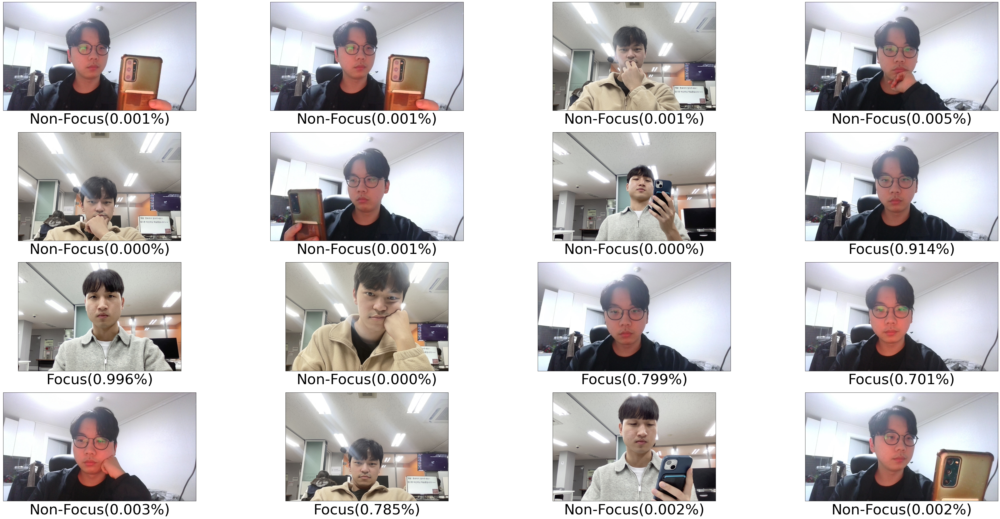

In [97]:
i=1
fig = plt.figure(figsize=(64,32))
rows = 4
cols = 4
plt.rc('axes', labelsize=20)
for path in data[0:16]:
    print("======")
    print(path)
    
    image = torchvision.io.read_image("./val_image/"+path)
    image = transform(image)
    check_img = cv2.imread("./val_image/"+path)
    
    #plt.imshow(check_img)
    #plt.show()
    result = model(image.unsqueeze(0))
    
    
    print(result)
    if result > 0.5:
        title = "Focus(%0.3f%%)" %(float(result[0][0]))
    else:
        title = "Non-Focus(%0.3f%%)" %(float(result[0][0]))
    
    ax1 = fig.add_subplot(rows, cols, i)
    ax1.imshow(cv2.cvtColor(check_img, cv2.COLOR_BGR2RGB))
    ax1.set_xlabel(title, fontsize=50)
    ax1.set_xticks([]), ax1.set_yticks([])
    i = i + 1

    
plt.show()

WIN_20231109_16_37_37_Pro.jpg
tensor([[0.8355]], grad_fn=<SigmoidBackward0>)
WIN_20231109_16_39_28_Pro.jpg
tensor([[0.0003]], grad_fn=<SigmoidBackward0>)
WIN_20231109_16_37_17_Pro.jpg
tensor([[0.0021]], grad_fn=<SigmoidBackward0>)
U_1.jpg
tensor([[0.0003]], grad_fn=<SigmoidBackward0>)
WIN_20231109_16_39_42_Pro.jpg
tensor([[0.6612]], grad_fn=<SigmoidBackward0>)
WIN_20231109_16_39_14_Pro.jpg
tensor([[0.0019]], grad_fn=<SigmoidBackward0>)
C_2.jpg
tensor([[0.0019]], grad_fn=<SigmoidBackward0>)
WIN_20231109_16_37_30_Pro.jpg
tensor([[0.0007]], grad_fn=<SigmoidBackward0>)
WIN_20231109_16_40_15_Pro.jpg
tensor([[0.0024]], grad_fn=<SigmoidBackward0>)
KakaoTalk_20231116_142951759.jpg
tensor([[0.1056]], grad_fn=<SigmoidBackward0>)
KakaoTalk_20231116_143021005.jpg
tensor([[0.0003]], grad_fn=<SigmoidBackward0>)
KakaoTalk_20231116_143259379.jpg
tensor([[0.0009]], grad_fn=<SigmoidBackward0>)
F_2.jpg
tensor([[0.7012]], grad_fn=<SigmoidBackward0>)
F_1.jpg
tensor([[0.6612]], grad_fn=<SigmoidBackward0>)
K

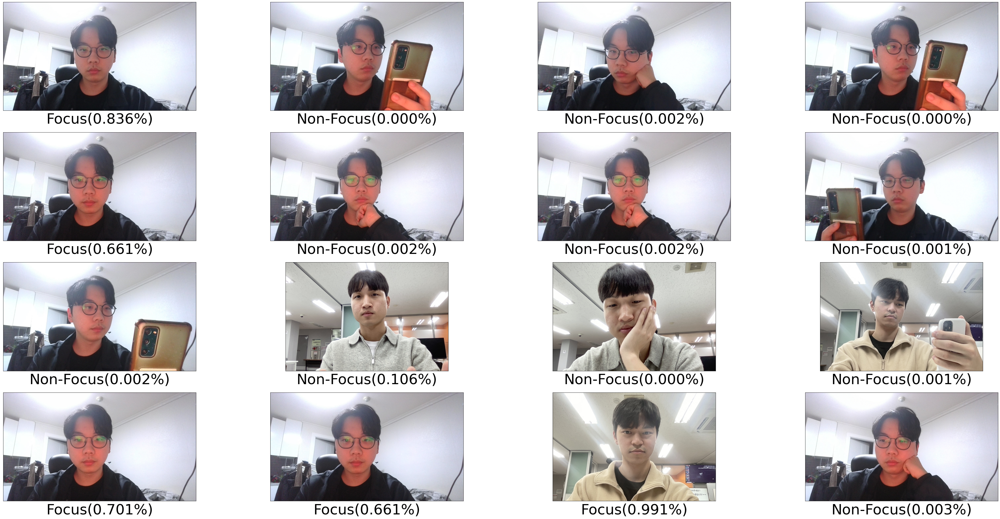

In [98]:
i=1
fig = plt.figure(figsize=(64,32))
rows = 4
cols = 4
plt.rc('axes', labelsize=20)
for path in data[16:32]:
    print("======")
    print(path)
    
    image = torchvision.io.read_image("./val_image/"+path)
    image = transform(image)
    check_img = cv2.imread("./val_image/"+path)
    
    #plt.imshow(check_img)
    #plt.show()
    result = model(image.unsqueeze(0))
    
    
    print(result)
    if result > 0.5:
        title = "Focus(%0.3f%%)" %(float(result[0][0]))
    else:
        title = "Non-Focus(%0.3f%%)" %(float(result[0][0]))
    
    ax1 = fig.add_subplot(rows, cols, i)
    ax1.imshow(cv2.cvtColor(check_img, cv2.COLOR_BGR2RGB))
    ax1.set_xlabel(title, fontsize=50)
    ax1.set_xticks([]), ax1.set_yticks([])
    i = i + 1

    
plt.show()

In [70]:
plt.show()

In [20]:
train_csv = pd.read_csv("./train.csv", index_col = 0)

In [32]:
train_csv.iloc[4]["image"]

'NIA22EYE_S1_001_T1_S01_L_rgb_A_D_T_025.png'

In [28]:
image = torchvision.io.read_image("./train_image/NIA22EYE_S1_001_T1_S01_L_rgb_A_D_T_025.png")
image = transform(image)
print(model(image.unsqueeze(0)))

tensor([[-3.1969,  3.9788]], grad_fn=<AddmmBackward0>)


In [62]:
#image load and preprocessing
image = torchvision.io.read_image("./crop_img/NIA22EYE_S1_013_T1_S04_L_rgb_F_D_T_151.png") #any image path
image = transform(image)

In [63]:
model(image.unsqueeze(0)).argmax(dim=1) 

tensor([1])

In [64]:
#0, 1 번째 값 중 큰 값의 index가 predict 결과
model(image.unsqueeze(0))

tensor([[-0.5123,  0.2603]], grad_fn=<AddmmBackward0>)